# Online Shopper Buying Intention

> 23520004 Muhammad Rifqi Abidin

> 23520054 Vicqy Bayu Putratama Viar

In [1]:
# import usual essential library
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import io

In [2]:
# import data
from google.colab import files
uploaded = files.upload()

Saving online_shoppers_intention.csv to online_shoppers_intention (2).csv


In [3]:
df = pd.read_csv(io.StringIO(uploaded['online_shoppers_intention.csv'].decode('utf-8')))
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

## Dataset Description

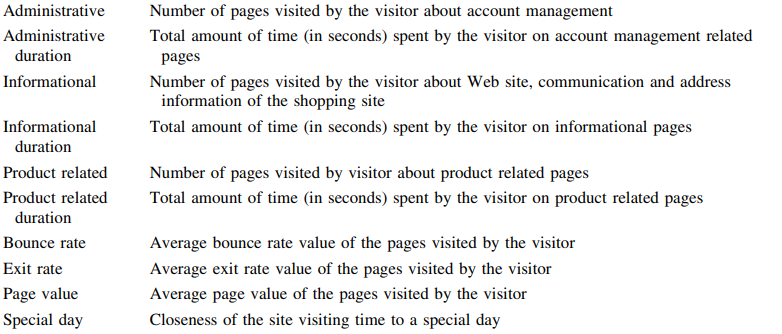
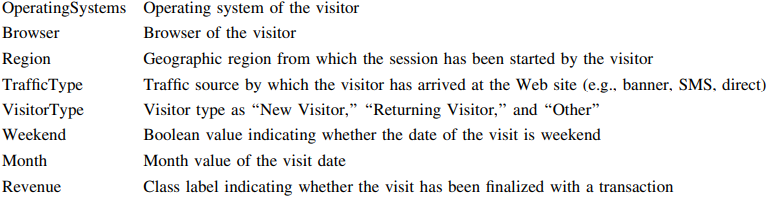

In [5]:
# menghitung unique distinct value pada tiap kolom
def uniqueColCount(dataframe):
    countList = []
    for column in dataframe.columns:
        countList.append(dataframe[column].nunique())
    return pd.DataFrame(countList, index=df.columns, columns=['uniqueCount'])

uniqueColCount(df)

,uniqueCount
Administrative,27
Administrative_Duration,3335
Informational,17
Informational_Duration,1258
ProductRelated,311
ProductRelated_Duration,9551
BounceRates,1872
ExitRates,4777
PageValues,2704
SpecialDay,6


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

## Data Preprocessing

Terdapat beberapa step preprocessing yang perlu diperhatikan sesuai karekteristik dataset, yaitu

1. Inkonsistensi pada tipe data
2. Standardisasi pada feature numerical, dan
3. Encoding pada feature categorical

Step 2 dan 3 akan dilakukan setelah tahapan Exploratory Data Analysis. Step 1 akan dilakukan untuk menyelesaikan problem berikut:

> Dataset terdiri dari data categorical dan numerical, namun beberapa data categorical masih memiliki type data int64 sehingga perlu dilakukan perubahan tipe data pada kolom OperatingSystems, Browser, Region, dan TrafficType.

> Untuk mempermudah proses analisis dan pembuatan model menggunakan sklearn pada step selanjutnya, maka kolom Weekend dan Revenue akan dilakukan perubahan tipe data dari boolean menjadi int64

In [7]:
df = df.astype({'OperatingSystems':'object',
                'Browser':'object',
                'Region':'object',
                'TrafficType':'object',
                'Weekend':'int64',
                'Revenue':'int64'})
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  object 
 12  Browser                  12330 non-null  object 
 13  Region                   12330 non-null  object 
 14  TrafficType           

In [8]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,0,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,0,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,0,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,0,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,0,0


> Kolom Weekend dan Revenue telah diubah menjadi int64 serta kolom categorical telah memiliki tipe object sehingga tipe data semua kolom telah benar.

In [9]:
# Banyak revenue pada class 0 dan 1
df.Revenue.value_counts()

0    10422
1     1908
Name: Revenue, dtype: int64

In [10]:
dfModel = df.copy()
dfModel

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,0,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,0,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,0,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,0,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,0,0


In [11]:
dfModel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  object 
 12  Browser                  12330 non-null  object 
 13  Region                   12330 non-null  object 
 14  TrafficType           

## Data Preprocessing

Pada preprocessing lanjutan ini akan dilakukan encoding feature categorical, splitting Train, Validation, dan Test, scaling feature numerical, dan oversampling pada data class minoritas.

Scaling dilakukan pada data train, validasi, dan test, dengan data train yang dijadikan data fitting pada scaler untuk ketiga data tersebut.

Oversampling dilakukan dengan menggunakan SMOTENC. SMOTENC akan membuat data sintetik pada class positif yang merupakan class minoritas. Namun pada SMOTENC, fitur kategorikal di exclude dari pembuatan data sintetik sehingga hanya data numerikalnya yang terkena proses sintesis.

In [12]:
# train_test_split
from sklearn.model_selection import train_test_split

dfModel = pd.get_dummies(dfModel, drop_first=True)

X = dfModel.drop(['Revenue'], axis=1)
y = dfModel['Revenue']

X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.2, random_state=101, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.1,
                                                  random_state=101, stratify=y_trainval)

In [13]:
dfModel

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,Revenue,Month_Dec,Month_Feb,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,OperatingSystems_2,OperatingSystems_3,OperatingSystems_4,OperatingSystems_5,OperatingSystems_6,OperatingSystems_7,OperatingSystems_8,Browser_2,Browser_3,Browser_4,Browser_5,Browser_6,Browser_7,Browser_8,Browser_9,Browser_10,Browser_11,Browser_12,Browser_13,Region_2,Region_3,Region_4,Region_5,Region_6,Region_7,Region_8,Region_9,TrafficType_2,TrafficType_3,TrafficType_4,TrafficType_5,TrafficType_6,TrafficType_7,TrafficType_8,TrafficType_9,TrafficType_10,TrafficType_11,TrafficType_12,TrafficType_13,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1


In [14]:
# standard scaling the numerical feature
from sklearn.preprocessing import StandardScaler


scaleColTrain = X_train[X_train.describe().columns[:10]]
scaleColTest = X_test[X_test.describe().columns[:10]]
scaleColVal = X_val[X_val.describe().columns[:10]]
scaler = StandardScaler().fit(scaleColTrain)

for idx, col in enumerate(X_train[X_train.describe().columns[:10]]):
  X_train[col] = scaler.transform(scaleColTrain)[:, idx]
  X_test[col] = scaler.transform(scaleColTest)[:, idx]
  X_val[col] = scaler.transform(scaleColVal)[:, idx]

In [15]:
# imbalance data handling using SVM-SMOTE
from imblearn.over_sampling import SMOTENC

smotenc = SMOTENC(random_state=101, categorical_features=list(range(10, 68)))
X_train_smotenc, y_train_smotenc = smotenc.fit_resample(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/loca

In [16]:
X_train_ = pd.DataFrame(X_train_smotenc, columns=X_train.columns)
y_train_ = pd.DataFrame(y_train_smotenc, columns=['Revenue'])

## Modelling

Proses pembuatan model dimulai dengan sebelumnya membuat model benchmark, yaitu model dengan parameter default dari sklearn. Model benchmark yang akan dibuat terdiri dari tiga algoritma yaitu berbasis Decision Tree yaitu CART, Random Forest Classifier, dan XGBoost Classifier.

Model kemudian akan dilakukan tuning parameter dengan strategi best guest pada parameter-parameternya untuk kemudian dicari parameter yang bisa memberikan performa lebih baik dari model benchmark.

Evaluasi dilakukan pada data validasi untuk dilihat responsnya sehingga hasil respons performancenya akan dijadikan acuan untuk melakukan improvement pada model selanjutnya. Model yang sudah dibuat kemudian akan dievaluasi performancenya menggunakan data test pada akhir percobaan.

## CART

In [17]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot

In [18]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, f1_score

CART_benchmark = DecisionTreeClassifier(random_state=101)
CART_benchmark.fit(X_train_, y_train_)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [19]:
dot_data_CART_benchmark = StringIO()
export_graphviz(CART_benchmark, out_file=dot_data_CART_benchmark, feature_names=X_train_.columns, filled=True, rounded=True)
graph = pydot.graph_from_dot_data(dot_data_CART_benchmark.getvalue())  
Image(graph[0].create_png())

In [20]:
from sklearn.model_selection import GridSearchCV

dtlcv = GridSearchCV(estimator=DecisionTreeClassifier(),
                     param_grid={'max_depth':[3, 5, 7, 10],
                                 'max_leaf_nodes':[7, 10, 15],
                                 'random_state':[101]},
                     scoring=['f1', 'f1_macro', 'accuracy'],
                     refit='f1_macro')
dtlcv_result = dtlcv.fit(X_train_, y_train_)

In [21]:
dtlcv_result.best_params_

{'max_depth': 5, 'max_leaf_nodes': 15, 'random_state': 101}

In [51]:
print(classification_report(y_val, dtlcv_result.best_estimator_.predict(X_val)))
print('\n')
print('f1 macro : ' + str(f1_score(y_val, dtlcv.best_estimator_.predict(X_val), average='macro')))

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       834
           1       0.57      0.80      0.66       153

    accuracy                           0.87       987
   macro avg       0.76      0.85      0.79       987
weighted avg       0.90      0.87      0.88       987



f1 macro : 0.7937790658488914


In [23]:
print('CART_benchmark validation performance :')
print(classification_report(y_val, CART_benchmark.predict(X_val)))
print(f1_score(y_val, CART_benchmark.predict(X_val), average='macro'))

CART_benchmark validation performance :
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       834
           1       0.51      0.63      0.56       153

    accuracy                           0.85       987
   macro avg       0.72      0.76      0.74       987
weighted avg       0.86      0.85      0.86       987

0.7370653034775723


### Random Forest



In [30]:
from sklearn.ensemble import RandomForestClassifier

RF_benchmark =RandomForestClassifier(random_state=101)
RF_benchmark.fit(X_train_, y_train_)

print('RF_benchmark validation performance :')
print(classification_report(y_val, RF_benchmark.predict(X_val)))
print(f1_score(y_val, RF_benchmark.predict(X_val), average='macro'))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


RF_benchmark validation performance :
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       834
           1       0.65      0.73      0.69       153

    accuracy                           0.90       987
   macro avg       0.80      0.83      0.81       987
weighted avg       0.90      0.90      0.90       987

0.8126116802668414


In [ ]:
rfcv = GridSearchCV(estimator=RandomForestClassifier(),
                     param_grid={'max_depth':[3, 5, 7, 10],
                                 'n_estimators':[50, 100, 150, 200],
                                 'max_leaf_nodes':[7, 10, 15],
                                 'max_features':[0.5, 0.8, 'auto'],
                                 'random_state':[101]},
                     scoring=['f1', 'f1_macro', 'accuracy'],
                     refit='f1_macro')
rfcv_result = rfcv.fit(X_train_, y_train_)

In [32]:
rfcv_result.best_params_

{'max_depth': 5,
 'max_features': 0.5,
 'max_leaf_nodes': 15,
 'n_estimators': 150,
 'random_state': 101}

In [33]:
print('RFcv_best performance validation performance :')
print(classification_report(y_val, rfcv_result.best_estimator_.predict(X_val)))

print('\n')
print('RFcv_best f1 macro : ' + str(f1_score(y_val, rfcv_result.best_estimator_.predict(X_val), average='macro')))

RFcv_best performance validation performance :
              precision    recall  f1-score   support

           0       0.96      0.88      0.92       834
           1       0.56      0.82      0.66       153

    accuracy                           0.87       987
   macro avg       0.76      0.85      0.79       987
weighted avg       0.90      0.87      0.88       987



RFcv_best f1 macro : 0.79180293288643


### XGBoost

In [37]:
from xgboost import XGBClassifier

XGB_benchmark = XGBClassifier(random_state=101)
XGB_benchmark.fit(X_train_, y_train_)

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/_label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/_label.py:268: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=101,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [38]:
print(classification_report(y_val, XGB_benchmark.predict(X_val)))
print(f1_score(y_val, XGB_benchmark.predict(X_val), average='macro'))

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       834
           1       0.56      0.78      0.65       153

    accuracy                           0.87       987
   macro avg       0.76      0.83      0.78       987
weighted avg       0.89      0.87      0.88       987

0.7841137801410382


In [39]:
xgbcv = GridSearchCV(estimator=XGBClassifier(),
                     param_grid={'max_depth':[3, 5, 7, 10],
                                 'n_estimators':[50, 100, 150, 200],
                                 'learning_rate':[0.01, 0.05, 0.1],
                                 'colsample_bytree':[0.5, 0.8, 1.0],
                                 'n_jobs':[-1],
                                 'random_state':[101]},
                     scoring=['f1', 'f1_macro', 'accuracy'],
                     n_jobs=-1,
                     refit='f1_macro')
xgbcv_result = xgbcv.fit(X_train_, y_train_)

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/_label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/_label.py:268: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [40]:
xgbcv_result.best_params_

{'colsample_bytree': 1.0,
 'learning_rate': 0.1,
 'max_depth': 10,
 'n_estimators': 200,
 'n_jobs': -1,
 'random_state': 101}

In [41]:
print('XGBcv_best performance validation performance :')
print(classification_report(y_val, xgbcv_result.best_estimator_.predict(X_val)))

print('\n')
print('XGBcv_best f1 macro : ' + str(f1_score(y_val, xgbcv_result.best_estimator_.predict(X_val), average='macro')))

XGBcv_best performance validation performance :
              precision    recall  f1-score   support

           0       0.94      0.93      0.94       834
           1       0.64      0.66      0.65       153

    accuracy                           0.89       987
   macro avg       0.79      0.80      0.79       987
weighted avg       0.89      0.89      0.89       987



XGBcv_best f1 macro : 0.7933545285359802


## Multi Layer Perceptron

In [46]:
from sklearn.neural_network import MLPClassifier

mlpcv = GridSearchCV(estimator=MLPClassifier(),
                     param_grid={'hidden_layer_sizes':[(10), (20), (40), (70)],
                                 'max_iter':[300],
                                 'activation':['relu'],
                                 'solver':['adam'],
                                 'random_state':[101]},
                     scoring=['f1', 'f1_macro', 'accuracy'],
                     n_jobs=-1,
                     refit='f1_macro')
mlpcv_result = mlpcv.fit(X_train_, y_train_)

/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [47]:
mlpcv_result.best_params_

{'activation': 'relu',
 'hidden_layer_sizes': 70,
 'max_iter': 300,
 'random_state': 101,
 'solver': 'adam'}

In [48]:
print('MLPcv_best performance validation performance :')
print(classification_report(y_val, mlpcv_result.best_estimator_.predict(X_val)))

print('\n')
print('MLPcv_best f1 macro : ' + str(f1_score(y_val, mlpcv_result.best_estimator_.predict(X_val), average='macro')))

MLPcv_best performance validation performance :
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       834
           1       0.57      0.64      0.60       153

    accuracy                           0.87       987
   macro avg       0.75      0.78      0.76       987
weighted avg       0.88      0.87      0.87       987



MLPcv_best f1 macro : 0.7636812570145903


## Hasil dan Analisis

Ke empat model yang dibentuk memiliki performance pada data validasi menggunakan metric f1 macro dengan nilai yang relatif sama, berada pada angka 0.79 dengan MLP sebagai pengecualian yaitu pada angka 0.76.

In [54]:
pd.DataFrame(data=[f1_score(y_val, dtlcv_result.best_estimator_.predict(X_val), average='macro'),
                   f1_score(y_val, rfcv_result.best_estimator_.predict(X_val), average='macro'),
                   f1_score(y_val, xgbcv_result.best_estimator_.predict(X_val), average='macro'),
                   f1_score(y_val, mlpcv_result.best_estimator_.predict(X_val), average='macro')],
             index=['CART', 'RF', 'XGB', 'MLP'],
             columns=['F1-Macro'])

,F1-Macro
CART,0.793779
RF,0.791803
XGB,0.793355
MLP,0.763681


In [69]:
pd.DataFrame(data=[f1_score(y_test, dtlcv_result.predict(X_test), average='macro')],
             index=['CART'],
             columns=['F1-Macro'])

,F1-Macro
CART,0.788736


In [64]:
print('DTL confusion matrix :')
print(confusion_matrix(y_val, dtlcv_result.best_estimator_.predict(X_val)))
print('\nRF confusion matrix :')
print(confusion_matrix(y_val, rfcv_result.best_estimator_.predict(X_val)))
print('\nXGB confusion matrix :')
print(confusion_matrix(y_val, xgbcv_result.best_estimator_.predict(X_val)))
print('\nMLP confusion matrix :')
print(confusion_matrix(y_val, mlpcv_result.best_estimator_.predict(X_val)))

DTL confusion matrix :
[[740  94]
 [ 30 123]]

RF confusion matrix :
[[735  99]
 [ 28 125]]

XGB confusion matrix :
[[778  56]
 [ 52 101]]

MLP confusion matrix :
[[761  73]
 [ 55  98]]


Hasil f1 macro yang didapatkan pada tiap model yang dibentuk memiliki nilai performa yang hampir sama. F1 macro dapat dihitung menggunakan precision dan recall yang didapatkan dari true positive, true negative, false positive, dan false negative. Berdasarkan hasil confusion matrix diatas, dapat kita bandingkan performa masing masing model terhadap data validasi.

1. Model Decision Tree dan Random Forest memiliki proporsi data yang mirip pada tiap elemen dari matrix (eg. true positif, true negatif etc.). Hal ini diduga yang dapat menyebabkan performa kedua model memiliki nilai yang mendekati.

2. Model Decision Tree dan Random Forest memiliki kemampuan untuk memprediksi class positif lebih baik daripada kedua model lainnya. Bisa dilihat dari nilai true positif yang lebih besar dan false negatif yang lebih kecil dibanding xgboost dan MLP.

3. Model XGB berkebalikan dengan model Decicision Tree dan Random Forest. XGB dapat memprediksi class negatif lebih baik dibandingkan dengan kedua model tersebut. Nilai True Negatif XGB lebih besar dan False Positif lebih kecil dari keduanya.

4. MLP memiliki performa yang paling buruk. Class negatif dapat terprediksi sedikit lebih baik dibanding Decision Tree dan Random Forest namun lebih kecil dari XGB. Namun performa MLP untuk memprediksi class positif lebih buruk dari semua model lainnya.

5. Kembali kepada tujuan asal dari pembentukan model, yaitu diperlukannya sistem untuk memprediksi buying intention maka apabila revenue merupakan suatu variable yang sangat penting untuk diperhitungkan (class positif/membeli) maka dapat digunakan model XGB yang lebih unggul dalam memprediksi class positif. Namun bila diperlukan model yang dapat memprediksi class positif dan negatif dengan sama baik, maka DTL dan RF dapat menjadi suatu alternatif.